# Hands-on Image Processing with Python

## Chapter 1: Getting started with Image Processing
**Author: Sandipan Dey**

We recommend creating a folder (sub-directory) to store images to be used for processing (for example, for the Python code samples, we have used the images stored inside a folder named images) and then provide the path to the folder to access the image to avoid the file not found exception.

### Import libraries

Use 'import module' or 'from module import'?
https://stackoverflow.com/questions/710551/use-import-module-or-from-module-import

In [1]:
%matplotlib inline
import skimage
print(skimage.__version__)

import numpy as np
import PIL as pil

from PIL import Image, ImageFont, ImageDraw
from PIL.ImageChops import add, subtract, multiply, difference, screen
import PIL.ImageStat as stat

from skimage.io import imread, imsave, imshow, show, imread_collection, imshow_collection
from skimage import color, viewer, exposure, img_as_float, data
from skimage.transform import SimilarityTransform, warp, swirl
from skimage.util import invert, random_noise, montage

from skimage import viewer
from skimage.viewer import ImageViewer
# https://scikit-image.org/docs/dev/user_guide/viewer.html

import skimage as skim
import skimage.io as skim_io
import skimage.transform as skim_tr
import skimage.util as skim_ut

import matplotlib.image as mpimg
import matplotlib.pylab as plt

from scipy.ndimage import affine_transform, zoom
from scipy import misc
import scipy.ndimage
import scipy 

0.14.0


/usr/local/lib/python3.5/dist-packages/skimage/viewer/__init__.py:6: UserWarning: Viewer requires Qt
  warn('Viewer requires Qt')


### Reading, saving, and displaying an image using PIL

The PIL function, <span class="girk">open()</span>, reads an image from disk in an Image object, as shown in the following code. The image is loaded as an object of the ***PIL.PngImagePlugin.PngImageFile*** class, and we can use properties such as the ***width, height, and mode*** to find the size (width x height in pixels or the resolution of the image) and mode of the image

In [4]:
im = pil.Image.open("../images/parrot.png") # read the image, provide the correct path
print(im.width, im.height, im.mode, im.format, type(im))
# 453 340 RGB PNG <class 'PIL.PngImagePlugin.PngImageFile'>
im.show() # display the image

453 340 RGB PNG <class 'PIL.PngImagePlugin.PngImageFile'>


The following code block shows how to use the PIL function, convert(), to convert the colored RGB image into a grayscale image:

In [5]:
im_g = im.convert('L') # convert the RGB color image to a grayscale image
im_g.save('../images/parrot_gray.png') # save the image to disk
pil.Image.open("../images/parrot_gray.png").show() # read the grayscale image from disk and show

### Reading, saving, and displaying an image using Matplotlib

The next code block shows how to use the **imread()** function from **matplotlib.image** to read an image in a floating-point numpy ndarray. The pixel values are represented as real values between 0 and 1:

(960, 1280, 4) float32 <class 'numpy.ndarray'>


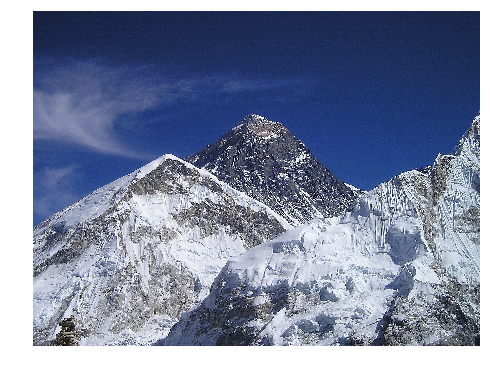

In [46]:
im = mpimg.imread("../images/hill.png") # read the image from disk as a numpy ndarray
print(im.shape, im.dtype, type(im)) # this image contains an α channel, hence num_channels= 4
# (960, 1280, 4) float32 <class 'numpy.ndarray'>
plt.figure(figsize=(8,8))
plt.imshow(im) # display the image
plt.axis('off')
plt.show()

The next code snippet changes the image to a darker image ***by first setting all of the pixel values below 0.5 to 0*** and then saving the numpy ndarray to disk. The saved image is again reloaded and displayed:

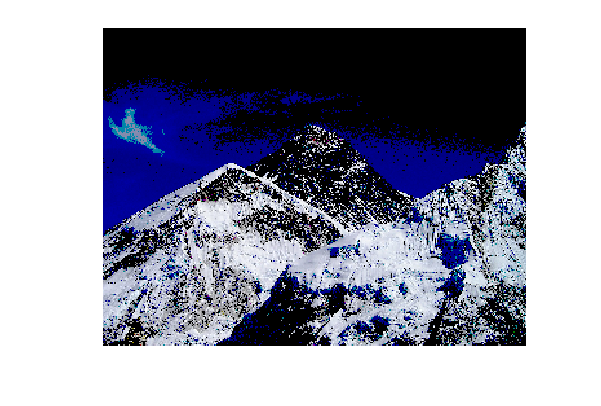

In [47]:
im1 = im
im1[im1 < 0.5] = 0 # make the image look darker
plt.imshow(im1)
plt.axis('off')
plt.tight_layout()
plt.savefig("../images/hill_dark.png") # save the dark image
plt.close()
im = mpimg.imread("../images/hill_dark.png") # read the dark image
plt.figure(figsize=(10,12))
plt.imshow(im)
plt.axis('off') # no axis ticks
# plt.tight_layout()
plt.show()

### Interpolating while displaying with matplotlib imshow

The imshow() function from Matplotlib provides many different types of interpolation methods to plot an image. These functions can be particularly useful when the image to be plotted is small. Let us use the small 50 x 50 lena image shown in the next figure to see the effects of plotting with different interpolation methods. the output of the preceding code

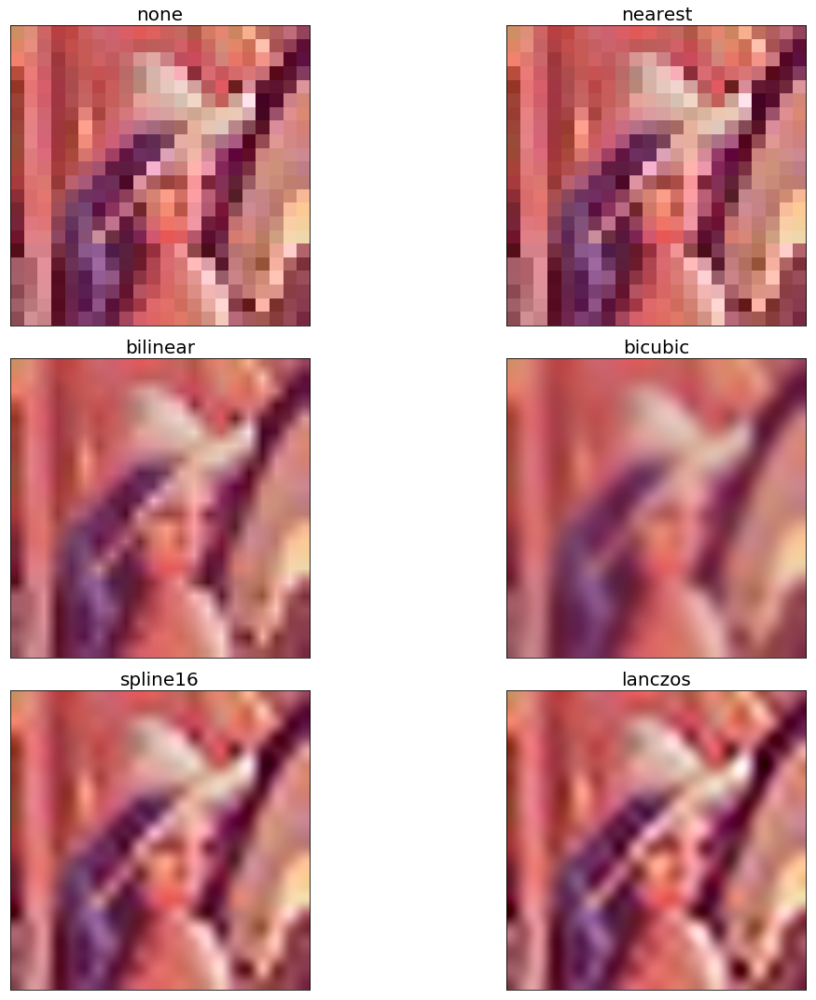

In [50]:
im = mpimg.imread("../images/lena_small.jpg") # read the image from disk as a numpy ndarray
methods = ['none', 'nearest', 'bilinear', 'bicubic', 'spline16', 'lanczos']
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(18, 15), subplot_kw={'xticks': [], 'yticks': []})
fig.subplots_adjust(hspace=0.05, wspace=0.05)
for ax, interp_method in zip(axes.flat, methods):
    ax.imshow(im, interpolation=interp_method)
    ax.set_title(str(interp_method), size=20)
plt.tight_layout()
plt.show()

### Reading, saving, and displaying an image using scikit-image

The next code block uses the imread() function from scikit-image to read an image in a numpy ndarray of type uint8 (8-bit unsigned integer). Hence, the pixel values will be in between 0 and 255. Then it converts (changes the image type or mode, which will be discussed shortly) the colored RGB image into an HSV image using the hsv2rgb() function from the Image.color module. Next, it changes the saturation (colorfulness) to a constant value for all of the pixels by keeping the hue and value channels unchanged. The image is then converted back into RGB mode with the rgb2hsv() function to create a new image, which is then saved and displayed:

(340, 453, 3) uint8 <class 'numpy.ndarray'>


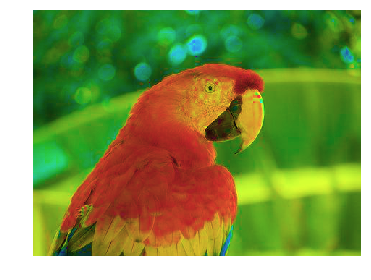

((0.0, 1.0, 0.0, 1.0), <matplotlib.image.AxesImage at 0x7f5a36e249e8>, None)

In [58]:
im = skim_io.imread("../images/parrot.png") # read image from disk, provide the correct path
print(im.shape, im.dtype, type(im))
hsv = skim.color.rgb2hsv(im) # from RGB to HSV color space
hsv[:, :, 1] = 0.8 # change the saturation
im1 = skim.color.hsv2rgb(hsv) # from HSV back to RGB
skim_io.imsave('parrot_hsv.png', im1) # save image to disk
im = skim_io.imread("parrot_hsv.png")
plt.axis('off'), skim_io.imshow(im), skim_io.show()

### Using scikit-image's astronaut dataset

The following code block shows how we can load the astronaut image from the scikit-image library's image datasets with the data module. The module contains a few other popular datasets, such as cameraman, which can be loaded similarly

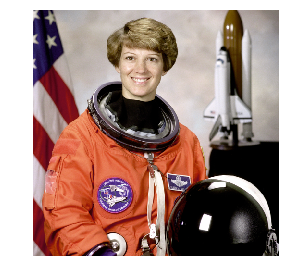

In [62]:
im = skim.data.astronaut()
skim.io.imshow(im) 
plt.axis('off') # no axis ticks
plt.show()

In [63]:
skim.io.show()

### Using scipy.misc's face dataset

The misc module of scipy can also be used for image I/O and display

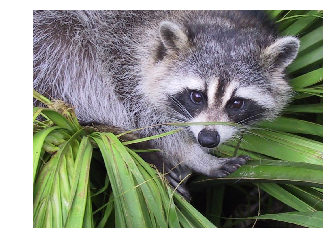

In [66]:
im = scipy.misc.face() # load the raccoon's face image
skim_io.imsave('face.png', im) # uses the Image module (PIL)
plt.imshow(im)
plt.axis('off')
plt.show()

In [67]:
im = skim_io.imread('../images/pepper.jpg')
print(type(im), im.shape, im.dtype)
# <class 'numpy.ndarray'> (225, 225, 3) uint8

<class 'numpy.ndarray'> (225, 225, 3) uint8


The I/O function's imread() is deprecated in SciPy 1.0.0, and will be removed in 1.2.0, so the documentation recommends we use the imageio library instead. The next code block shows how an image can be read with the <span class="burk">imageio.imread()</span> function and can be displayed with Matplotlib

<class 'imageio.core.util.Array'> (225, 225, 3) uint8


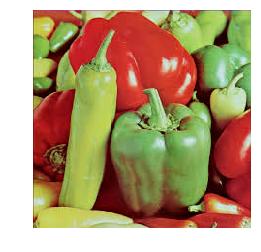

In [68]:
import imageio
im = imageio.imread('../images/pepper.jpg')
print(type(im), im.shape, im.dtype)
plt.imshow(im)
plt.axis('off')
plt.show()

### Converting from one file format to another

Using PIL, we can read an image in one file format and save it to another; for example, from PNG to JPG

In [22]:
im = pil.Image.open("../images/parrot.png")
print(im.mode)
im.save("../images/parrot.jpg")

RGB


But if the PNG file is in the RGBA mode, we need to convert it into the RGB mode before we save it as JPG, as otherwise it will give an error. The next code block shows how to first convert and then save

In [23]:
im = pil.Image.open("../images/hill.png")
print(im.mode)
# RGBA
im.convert('RGB').save("../images/hill.jpg") # first convert to RGB mode

RGBA


**Image types (modes)**                                                <p>An image can be of the following different types:</p>
- Single channel images—each pixel is represented by a single value:
    * Binary (monochrome) images (each pixel is represented by a single 0-1 bit)
    * Gray-level images (each pixel can be represented with 8-bits and can have values typically in the range of 0-255)
- Multi-channel images—each pixel is represented by a tuple of values:
    * 3-channel images; for example, the following: 
        - RGB images—each pixel is represented by three-tuple (r, g, b) values, representing red, green, and blue channel color values for every pixel.
        - HSV images—each pixel is represented by three-tuple (h, s, v) values, representing hue (color), saturation (colorfulness—how much the color is mixed with white), and value (brightness—how much the color is mixed with black) channel color values for every pixel. The HSV model describes colors in a similar manner to how the human eye tends to perceive colors. 
    * Four-channel images; for example, RGBA images—each pixel is represented by three-tuple (r, g, b, α) values, the last channel representing the transparency.

### Converting from one image mode into another

Note that we can lose some information while converting into grayscale for some colored images. The following code shows such an example with Ishihara plates, used to detect color-blindness. This time, the <span class="burk">rgb2gray()</span> function is used from the color module, and both the color and the grayscale images are shown side by side. As can be seen in the following figure, the number 8 is almost invisible in the grayscale version

(340, 453)


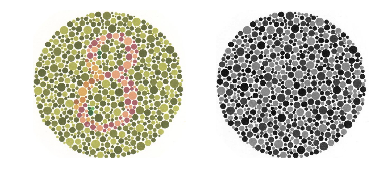

In [69]:
im = skim_io.imread("../images/parrot.png", as_gray=True)
print(im.shape)
im = skim.io.imread("../images/Ishihara.png")
im_g = skim.color.rgb2gray(im)
plt.subplot(121), plt.imshow(im, cmap='gray'), plt.axis('off')
plt.subplot(122), plt.imshow(im_g, cmap='gray'), plt.axis('off')
plt.show()

### Converting from one color space into another

We can convert from one color space into another using library functions; for example, the following code converts an RGB color space into an HSV color space image

The next figure shows the h (heu or color: dominant wave length of reflected light), s (saturation or chroma) and v (value or brightness/luminescence) channels of the parrot HSV image, created using the code

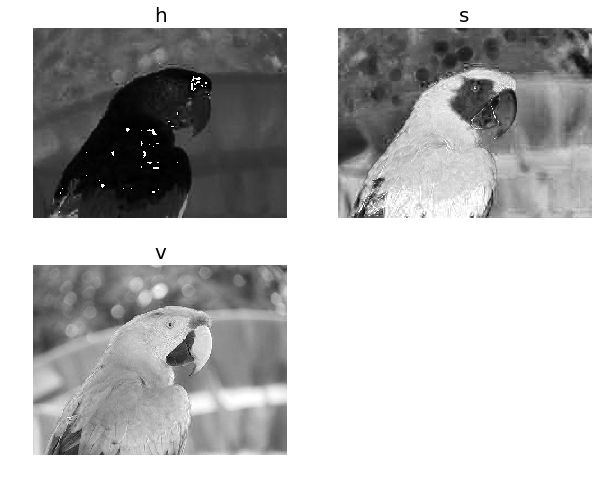

In [70]:
im = skim.io.imread("../images/parrot.png")
im_hsv = skim.color.rgb2hsv(im)
plt.gray()
plt.figure(figsize=(10,8))
plt.subplot(221), plt.imshow(im_hsv[...,0]), plt.title('h', size=20),
plt.axis('off')
plt.subplot(222), plt.imshow(im_hsv[...,1]), plt.title('s', size=20),
plt.axis('off')
plt.subplot(223), plt.imshow(im_hsv[...,2]), plt.title('v', size=20),
plt.axis('off')
plt.subplot(224), plt.axis('off')
plt.show()

Similarly, we can convert the image into the YUV color space using the <span class="burk">rgb2yuv()</span> function

### Converting image data structures

In [71]:
im = pil.Image.open('../images/flowers.png') # read image into an Image object with PIL

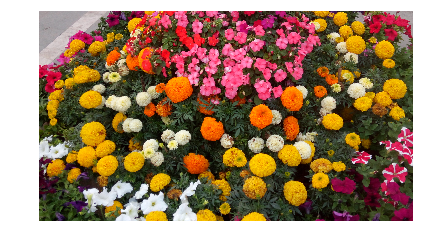

In [73]:
im = np.array(im) # create a numpy ndarray from the Image object
skim.io.imshow(im) # use skimage imshow to display the image
plt.axis('off')
skim_io.show()

In [74]:
im = skim_io.imread('../images/flowers.png') # read image into numpy ndarray with skimage
im = pil.Image.fromarray(im) # create a PIL Image object from the numpy ndarray
im.show() # display the image with PIL Image.show() method

In [75]:
x = np.zeros(10)
x.flags.writeable = True
print("Test the array is read-only or not:")
print("Try to change the value of the first element:")
x[0] = 1
x

Test the array is read-only or not:
Try to change the value of the first element:


array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

### Image manipulations with numpy array slicing

[230 134 118]


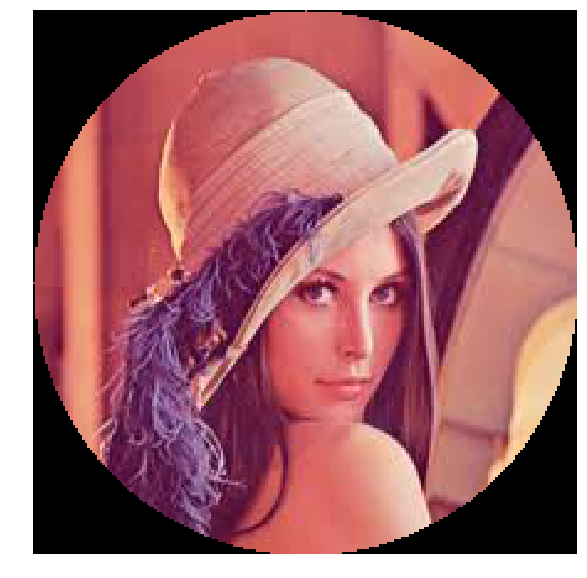

In [88]:
lena = mpimg.imread("../images/lena.jpg") # read the image from disk as a numpy ndarray
# print(lena)
print(lena[0, 0])
# print(lena[10:13, 20:23,0:1]) # slicing
lx, ly, _ = lena.shape
X, Y = np.ogrid[0:lx, 0:ly]
mask = (X - lx / 2) ** 2 + (Y - ly / 2) ** 2 > lx * ly / 4
# lena_1=lena.tolist()
# lena_1.flags.writeable = True
lena[mask,:] = 0 # masks

plt.figure(figsize=(10,10))
plt.imshow(lena)
plt.axis('off')
plt.show()

### Simple image morphing - α-blending of two images using cross-dissolving

The following code block shows how to start from one face image (image1 being the face of Messi) and end up with another image (image2 being the face of Ronaldo) by using a linear combination of the two image numpy ndarrays given with the following equation
<br><img src="../images/eq-1.png" ></br>
<br>We do this by iteratively increasing α from 0 to 1</br>

The next figure shows the sequence of the α-blended images created using the previous code by cross-dissolving Messi's face image into Ronaldo's. As can be seen from the sequence of intermediate images in the figure, the face morphing with simple blending is not very smooth. In upcoming chapters, we shall see more advanced techniques for image morphing

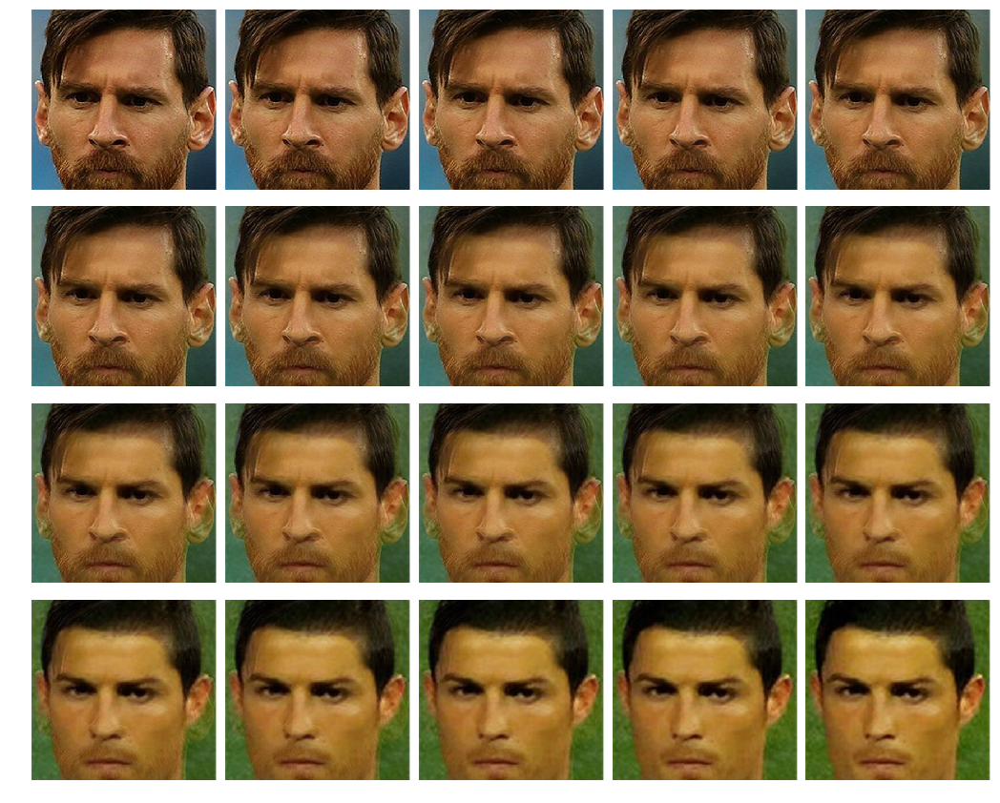

In [89]:
im1 = mpimg.imread("../images/messi.jpg") / 255 # scale RGB values in [0,1]
im2 = mpimg.imread("../images/ronaldo.jpg") / 255
i = 1
plt.figure(figsize=(18,15))
for alpha in np.linspace(0,1,20):
    plt.subplot(4,5,i)
    plt.imshow((1-alpha)*im1 + alpha*im2)
    plt.axis('off')
    i += 1
plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()

### Image manipulations with PIL

PIL provides us with many functions to manipulate an image; for example, using a point transformation to change pixel values or to perform geometric transformations on an image. Let us first start by loading the parrot PNG image, as shown in the following code

453 340 RGB PNG


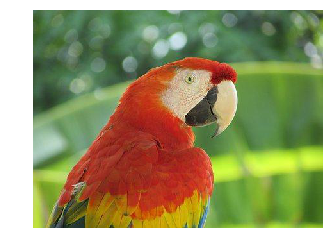

In [94]:
im = pil.Image.open("../images/parrot.png") # open the image, provide the correct path
print(im.width, im.height, im.mode, im.format) # print image size, mode and format
plt.imshow(im)
plt.axis("off")
plt.show()

### Cropping an image

We can use the crop() function with the desired rectangle argument to crop the corresponding area from the image, as shown in the following code

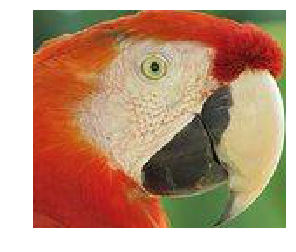

In [101]:
im_c = im.crop((175,75,320,200)) # crop the rectangle given by (left, top, right, bottom) from the image
# im_c.show()
plt.imshow(im_c)
plt.axis("off")
plt.show()

### Resizing an image

In order to increase or decrease the size of an image, we can use the resize() function, which internally up-samples or down-samples the image, respectively. This will be discussed in detail in the next chapter

**Resizing to a larger image**

In [109]:
im = pil.Image.open("../images/clock.jpg")
print(im.width, im.height)
im.show()
# plt.imshow(im)
# plt.axis("off")
# plt.show()

107 105


In [113]:
im_large = im.resize((im.width*5, im.height*5), pil.Image.BILINEAR) # bi-linear interpolation
print(im_large.width, im_large.height)
im_large.show()
# plt.imshow(im_large)
# plt.axis("off")
# plt.show()

535 525


**Resizing to a smaller image**

In [114]:
im = Image.open("../images/victoria_memorial.png")
print(im.width, im.height)
im.show()

720 540


In [117]:
im_small = im.resize((im.width//5, im.height//5), pil.Image.ANTIALIAS)
print(im_small.width, im_small.height)
im_small.show()

144 108


### Negating an image

We can use the <span class="burk">point()</span> function to transform each pixel value with a single-argument function. We can use it to negate an image, as shown in the next code block. The pixel values are represented using 1-byte unsigned integers, which is why subtracting it from the maximum possible value will be the exact point operation required on each pixel to get the inverted image

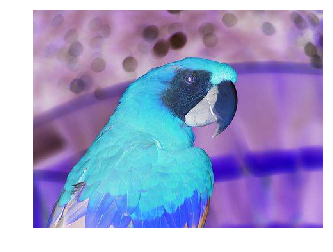

In [124]:
im = pil.Image.open("../images/parrot.png")
im_t = im.point(lambda x: 255 - x)
# im_t.show()
plt.imshow(im_t)
plt.axis("off")
plt.show()

### Converting an image into grayscale

We can use the <span class="burk">convert()</span> function with the 'L' parameter to change an RGB color image into a gray-level image

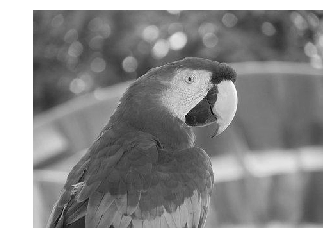

In [127]:
im_g = im.convert('L') # convert the RGB color image to a grayscale image
plt.imshow(im_g)
plt.axis("off")
plt.show()

### Log transformation

The log transformation can be used to effectively compress an image that has a dynamic range of pixel values. The following code uses the point transformation for logarithmic transformation. As can be seen, the range of pixel values is narrowed, the brighter pixels from the input image have become darker, and the darker pixels have become brighter, thereby shrinking the range of values of the pixels

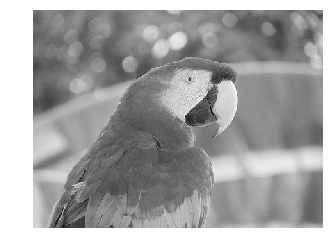

In [130]:
img_g_transform=im_g.point(lambda x: 255*np.log(1+x/255))
plt.imshow(img_g_transform)
plt.axis("off")
plt.show()

### Power-law transformation

This transformation is used as γ correction for an image. The next line of code shows how to use the point() function for a power-law transformation, where γ = 0.6

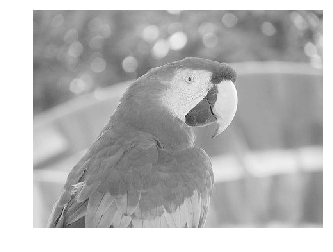

In [137]:
img_g_law_transform=im_g.point(lambda x: 255*(x/255)**0.6)
plt.imshow(img_g_law_transform)
plt.axis("off")
plt.show()

### Reflecting an image

We can use the transpose() function to reflect an image with regard to the horizontal or vertical axis

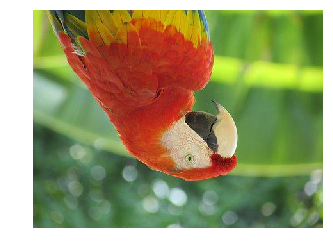

In [170]:
im=im.transpose(pil.Image.FLIP_LEFT_RIGHT) # reflect about the vertical axis
plt.imshow(im)
plt.axis("off")
plt.show()

In [168]:
# im=im.transpose(pil.Image.FLIP_TOP_BOTTOM) # reflect about the vertical axis
# plt.imshow(im)
# plt.axis("off")
# plt.show()

### Rotating an image

We can use the rotate() function to rotate an image by an angle (in degrees)

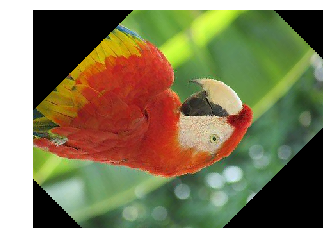

In [172]:
im_45 = im.rotate(45) # rotate the image by 45 degrees
# im_45.show() # show the rotated image
plt.imshow(im_45)
plt.axis("off")
plt.show()

### Applying an Affine transformation on an image

A 2-D Affine transformation matrix, T, can be applied on each pixel of an image (in homogeneous coordinates) to undergo an Affine transformation, which is often implemented with inverse mapping (warping). An interested reader is advised to refer to this article (https://sandipanweb.wordpress.com/2018/01/21/recursive-graphics-bilinear-interpolation-and-image-transformation-in-python/) to understand how these transformations can be implemented (from scratch).
<br>The following code shows the output image obtained when the input image is transformed with a shear transform matrix. The data argument in the transform() function is a 6-tuple (a, b, c, d, e, f), which contains the first two rows from an Affine transform matrix. For each pixel (x, y) in the output image, the new value is taken from a position (a x + b y + c, d x + e y + f) in the input image, which is rounded to nearest pixel. The transform() function can be used to scale, translate, rotate, and shear the original image</br>

In [177]:
im = pil.Image.open("../images/parrot.png")
im.transform((int(1.4*im.width), im.height), pil.Image.AFFINE,
data=(1,-0.5,0,0,1,0)).show() # shear
# plt.imshow(data)

### Perspective transformation

We can run a perspective transformation on an image with the transform() function by using the Image.PERSPECTIVE argument, as shown in the next code block

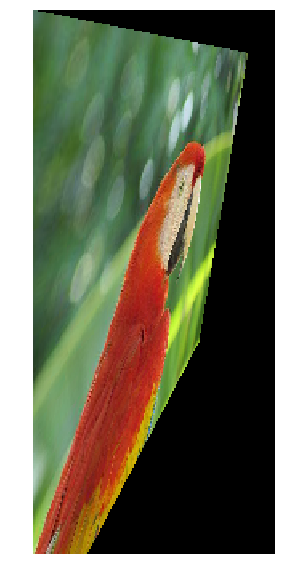

In [181]:
params = [1, 0.1, 0, -0.1, 0.5, 0, -0.005, -0.001]
im1 = im.transform((im.width//3, im.height), pil.Image.PERSPECTIVE, params,
pil.Image.BICUBIC)
# im1.show()
plt.figure(figsize=(10,10))
plt.imshow(im1)
plt.axis("off")
plt.show()

### Changing pixel values of an image

We can use the putpixel() function to change a pixel value in an image. Next, let us discuss a popular application of adding noise to an image using the function.
<p>Adding salt and pepper noise to an image</p>
<p>We can add some <span class="burk">salt-and-pepper noise</span> to an image by selecting a few pixels from the image randomly and then setting about half of those pixel values to black and the other half to white. The next code snippet shows how to add the noise</p>

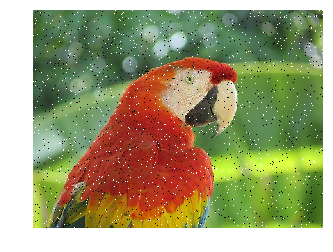

In [183]:
# choose 5000 random locations inside image
im1 = im.copy() # keep the original image, create a copy
n = 5000
x, y = np.random.randint(0, im.width, n), np.random.randint(0, im.height,n)
for (x,y) in zip(x,y):
    im1.putpixel((x, y), ((0,0,0) if np.random.rand() < 0.5 else (255,255,255))) # salt-and-pepper noise
# im1.show()
plt.imshow(im1)
plt.axis("off")
plt.show()

### Drawing on an image

We can draw lines or other geometric shapes on an image (for example, the ellipse() function to draw an ellipse) from the PIL.ImageDraw module, as shown in the next Python code snippet

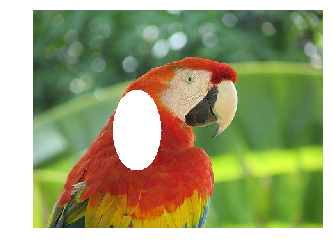

In [186]:
import PIL.ImageDraw

im = pil.Image.open("../images/parrot.png")
draw = pil.ImageDraw.Draw(im)
draw.ellipse((125, 125, 200, 250), fill=(255,255,255,128))
del draw
# im.show()
plt.imshow(im)
plt.axis("off")
plt.show()

### Drawing text on an image

We can add text to an image using the text() function from the PIL.ImageDraw module, as shown in the next Python code snippet

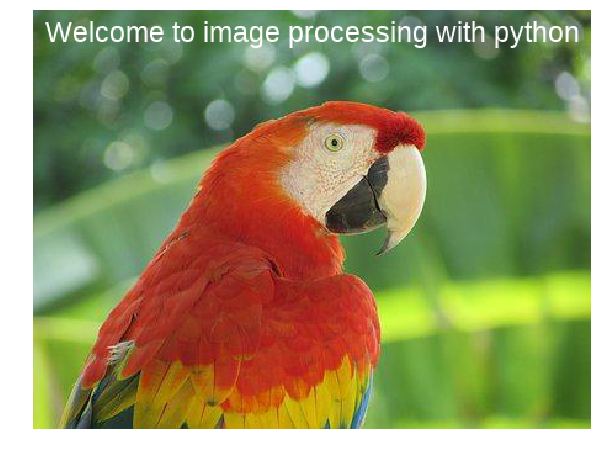

In [190]:
import PIL.ImageFont

im = pil.Image.open("../images/parrot.png")
draw = pil.ImageDraw.Draw(im)
# font = pil.ImageFont.load("arial.pil")
font = pil.ImageFont.truetype("LiberationSans-Regular.ttf", 23) # use a truetype font

draw.text((10, 5), "Welcome to image processing with python", font=font)
del draw
# im.show()
plt.figure(figsize=(10,10))
plt.imshow(im)
plt.axis("off")
plt.show()

### Creating a thumbnail

We can create a thumbnail from an image with the thumbnail() function

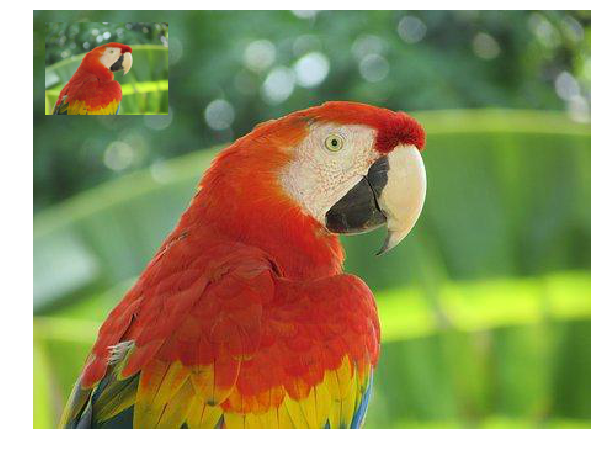

In [193]:
im = pil.Image.open("../images/parrot.png")
im_thumbnail = im.copy() # need to copy the original image first
im_thumbnail.thumbnail((100,100)) # now paste the thumbnail on the image
im.paste(im_thumbnail, (10,10))
im.save("../images/parrot_thumb.jpg")
# im.show()
plt.figure(figsize=(10,10))
plt.imshow(im)
plt.axis("off")
plt.show()

### Computing the basic statistics of an image

We can use the stat module to compute the basic statistics (mean, median, standard deviation of pixel values of different channels, and so on) of an image

In [195]:
import PIL.ImageStat as stat

s = stat.Stat(im)
# maximum and minimum pixel values for each channel R, G, B
print(s.extrema) 

[(0, 255), (0, 255), (0, 253)]


In [196]:
print(s.count)

[154020, 154020, 154020]


In [197]:
print(s.mean)

[127.6216919880535, 124.87110115569406, 67.89499415660303]


In [198]:
print(s.median)

[121, 130, 62]


In [199]:
print(s.stddev)

[47.68779592915661, 52.249097463622974, 39.91251964471368]


### Plotting the histograms of pixel values for the RGB channels of an image

The histogram() function can be used to compute the histogram (a table of pixel values versus frequencies) of pixels for each channel and return the concatenated output (for example, for an RGB image, the output contains 3 x 256 = 768 values)

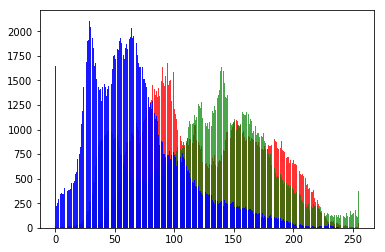

In [205]:
pl = im.histogram()
plt.bar(range(256), pl[:256], color='r', alpha=0.8)
plt.bar(range(256), pl[256:2*256], color='g', alpha=0.7)
plt.bar(range(256), pl[2*256:], color='b', alpha=0.9)
plt.show()

### Separating the RGB channels of an image

We can use the split() function to separate the channels of a multi-channel image, as is shown in the following code for an RGB image

The following figure shows three output images created for each of the R (red), G (green), and B (blue) channels generated by running the previous code

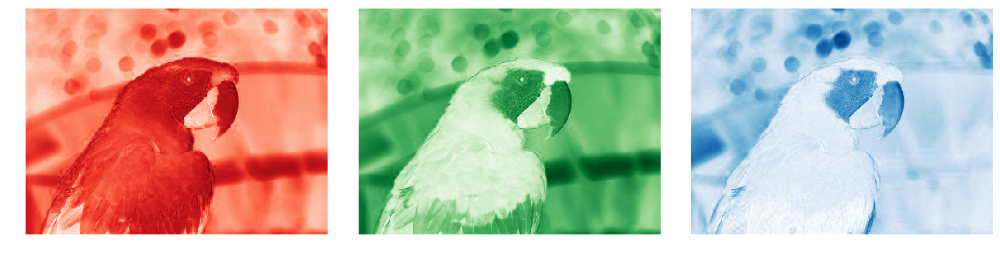

In [206]:
im = pil.Image.open("../images/parrot.png")
ch_r, ch_g, ch_b = im.split() # split the RGB image into 3 channels: R, G and B
# we shall use matplotlib to display the channels
plt.figure(figsize=(18,6))
plt.subplot(1,3,1); plt.imshow(ch_r, cmap=plt.cm.Reds); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(ch_g, cmap=plt.cm.Greens); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(ch_b, cmap=plt.cm.Blues); plt.axis('off')
plt.tight_layout()
plt.show() # show the R, G, B channels

### Combining multiple channels of an image

We can use the merge() function to combine the channels of a multi-channel image, as is shown in the following code, wherein the color channels obtained by splitting the parrot RGB image are merged after swapping the red and blue channels

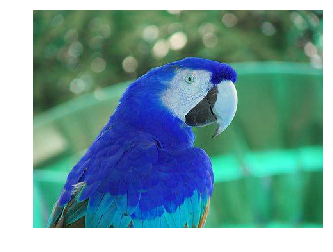

In [209]:
im = pil.Image.merge('RGB', (ch_b, ch_g, ch_r)) # swap the red and blue channels obtained last time with split()
# im.show()
plt.imshow(im)
plt.axis("off")
plt.show()

### α-blending two images

The blend() function can be used to create a new image by interpolating two given images (of the same size) using a constant, α. Both images must have the same size and mode. The output image is given by the following
<img src="../images/eq-2.png" >
<p>If α is 0.0, a copy of the first image is returned. If α is 1.0, a copy of the second image is returned. The next code snippet shows an example</p>

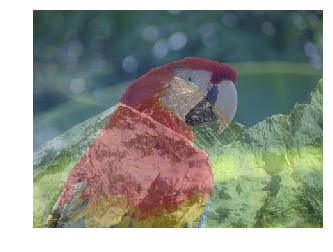

In [212]:
im1 = pil.Image.open("../images/parrot.png")
im2 = pil.Image.open("../images/hill.png")
im1 = im1.convert('RGBA') # two images have different modes, must be converted to the same mode
im2 = im2.resize((im1.width, im1.height), pil.Image.BILINEAR) # two images have different sizes, must be converted to the same size
im = pil.Image.blend(im1, im2, alpha=0.5)
plt.imshow(im)
plt.axis("off")
plt.show()

### Superimposing two images

An image can be superimposed on top of another by multiplying two input images (of the same size) pixel by pixel

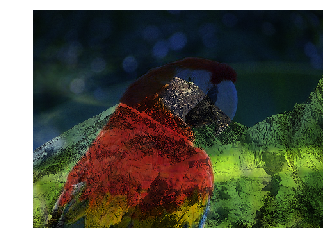

In [214]:
im1 = pil.Image.open("../images/parrot.png")
im2 = pil.Image.open("../images/hill.png").convert('RGB').resize((im1.width, im1.height))
im=pil.ImageChops.multiply(im1, im2)
plt.imshow(im)
plt.axis("off")
plt.show()

### Adding two images

The next code snippet shows how an image can be generated by adding two input images (of the same size) pixel by pixel

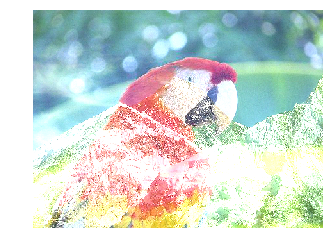

In [215]:
im=pil.ImageChops.add(im1, im2)
plt.imshow(im)
plt.axis("off")
plt.show()

### Computing the difference between two images

The following code returns the absolute value of the pixel-by-pixel difference between images. Image difference can be used to detect changes between two images. For example, the next code block shows how to compute the difference image from two successive frames from a video recording (from YouTube) of a match from the 2018 FIFA World Cup

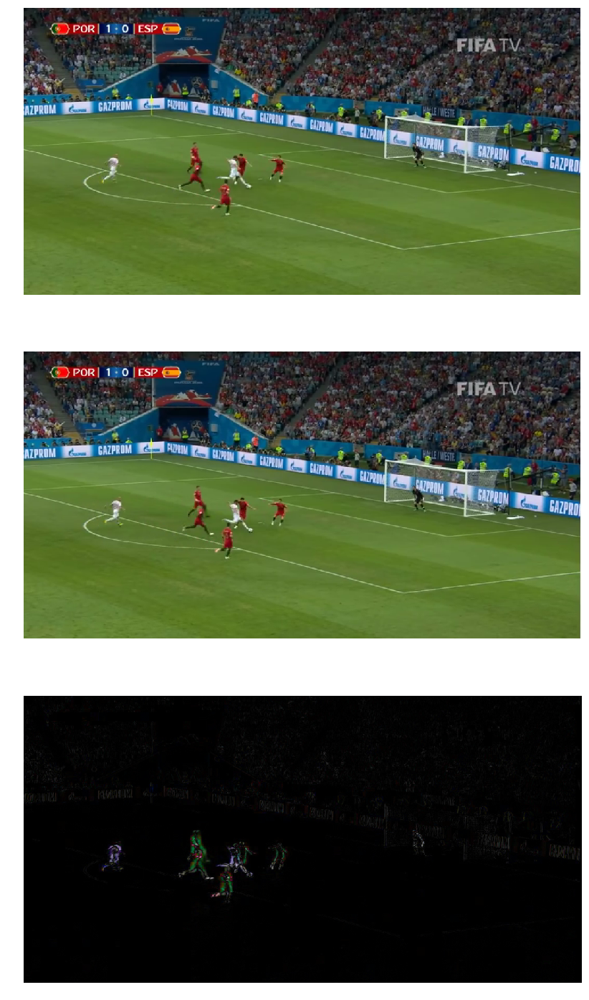

In [216]:
#from PIL.ImageChops import subtract, multiply, screen, difference, add
im1 = pil.Image.open("../images/goal1.png") # load two consecutive frame images from the video
im2 = pil.Image.open("../images/goal2.png")
im = pil.ImageChops.difference(im1, im2)
plt.figure(figsize=(20,25))
im.save("../images/goal_diff.png")
plt.subplot(311)
plt.imshow(im1)
plt.axis('off')
plt.subplot(312)
plt.imshow(im2)
plt.axis('off')
plt.subplot(313)
plt.imshow(im), plt.axis('off')
plt.show()

### Inverse warping and geometric transformation using the warp() function

The scikit-image transform module's warp() function can be used for inverse warping for the geometric transformation of an image (discussed in a previous section), as demonstrated in the following examples.
Applying an Affine transformation on an image
<p>We can use the SimilarityTransform() function to compute the transformation matrix, followed by warp() function, to carry out the transformation, as shown in the next code block</p>

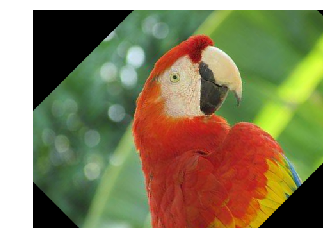

In [218]:
import skimage.transform as tr

im = skim.io.imread("../images/parrot.png")
tform = tr.SimilarityTransform(scale=0.9,
rotation=np.pi/4,translation=(im.shape[0]/2, -100))
warped = tr.warp(im, tform)
import matplotlib.pyplot as plt
plt.imshow(warped)
plt.axis('off')
plt.show()

### Applying the swirl transform

This is a non-linear transform defined in the scikit-image documentation. The next code snippet shows how to use the swirl() function to implement the transform, where strength is a parameter to the function for the amount of swirl, radius indicates the swirl extent in pixels, and rotation adds a rotation angle. The transformation of radius into r is to ensure that the transformation decays to ≈ 1/1000th ≈ 1/1000th within the specified radius

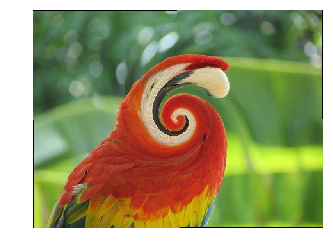

In [221]:
im = skim.io.imread("../images/parrot.png")
swirled = tr.swirl(im, rotation=0, strength=10, radius=200)
plt.imshow(swirled)
plt.axis('off')
plt.show()

### Adding random Gaussian noise to images

We can use the random_noise() function to add different types of noise to an image. The next code example shows how Gaussian noise with different variances can be added to an image

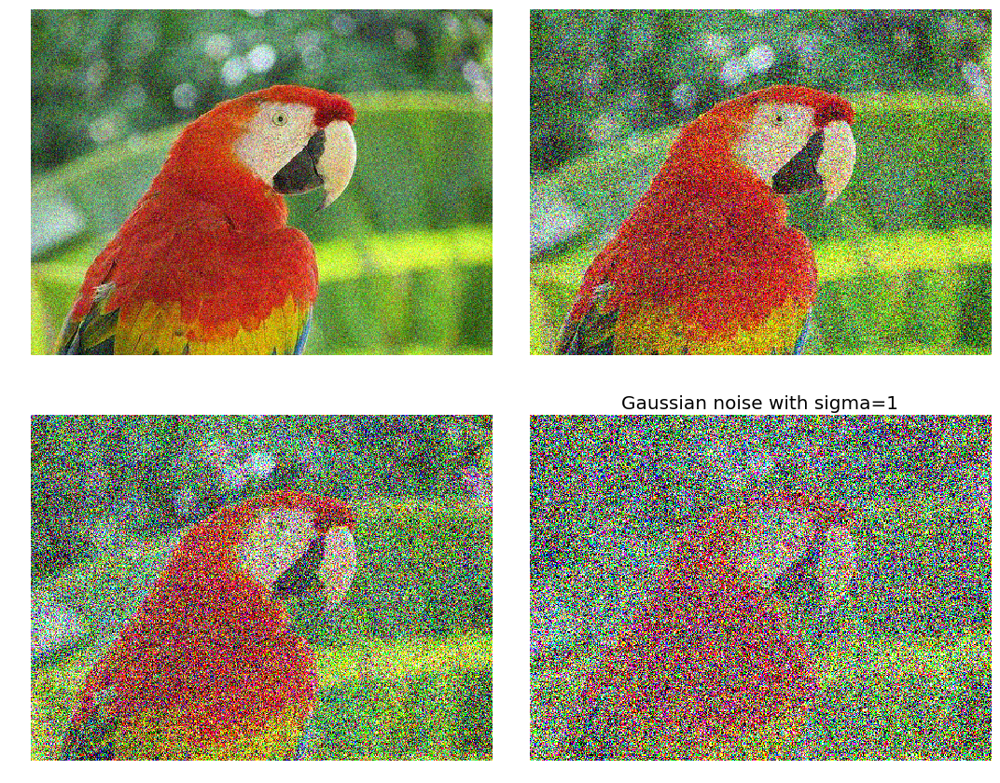

In [222]:
im = skim.img_as_float(skim.io.imread("../images/parrot.png"))
plt.figure(figsize=(15,12))
sigmas = [0.1, 0.25, 0.5, 1]
for i in range(4):
    noisy = skim_ut.random_noise(im, var=sigmas[i]**2)
    plt.subplot(2,2,i+1)
    plt.imshow(noisy)
    plt.axis('off')
plt.title('Gaussian noise with sigma=' + str(sigmas[i]), size=20)
plt.tight_layout()
plt.show()

### Drawing contour lines for an image

A contour line for an image is a curve connecting all of the pixels where they have the same particular value. The following code block shows how to draw the contour lines and filled contours for a grayscale image of Einstein

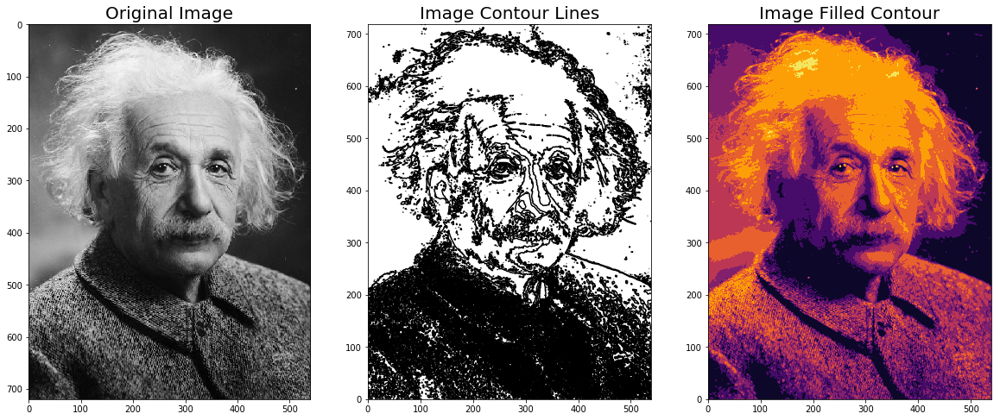

In [223]:
from skimage.color import rgb2gray
im = rgb2gray(skim_io.imread("../images/einstein.jpg")) # read the image from disk as a numpy ndarray
plt.figure(figsize=(20,8))
plt.subplot(131), plt.imshow(im, cmap='gray'), plt.title('Original Image', size=20)
plt.subplot(132), plt.contour(np.flipud(im), colors='k',
levels=np.logspace(-15, 15, 100))
plt.title('Image Contour Lines', size=20)
plt.subplot(133), plt.title('Image Filled Contour', size=20),
plt.contourf(np.flipud(im), cmap='inferno')
plt.show()

### Summary  

In this chapter, we first provided a basic introduction to image processing and basic concepts regarding the problems that we try to solve in image processing. We then discussed different tasks and steps with image processing, and the leading image processing libraries in Python, which we are going to use for coding in this book. Next, we talked about how to install different libraries for image processing in Python, and how to import them and call the functions from the modules. We also covered basic concepts about image types, file formats, and data structures to store image data with different Python libraries. Then, we discussed how to perform image I/O and display in Python using different libraries. Finally, we discussed how to perform basic image manipulations with different Python libraries. In the next chapter, we will deep dive into sampling, quantization, convolution, the Fourier transform, and frequency domain filtering on images.

### Further reading

- Digital Image Processing, a book by Rafael C. Gonzalez and Richard E. Woods for image processing concepts
- The lecture notes / handouts from this (https://web.stanford.edu/class/ee368/handouts.html) course from Stanford University and this (https://ocw.mit.edu/resources/res-2-006-girls-who-build-cameras-summer-2016/) one from MIT
- http://scikit-image.org/docs/dev/api/skimage.html
- https://pillow.readthedocs.io/en/3.1.x/reference/Image.html
https://docs.scipy.org/doc/scipy-1.1.0/reference/ndimage.html
- https://matplotlib.org/galleryhttp://members.cbio.mines-paristech.fr/~nvaroquaux/formations/scipy-lecture-notes/advanced/image_processing/index.html
- http://www.scipy-lectures.org/https://web.cs.wpi.edu/~emmanuel/courses/cs545/S14/slides/lecture09.pdfhttp://fourier.eng.hmc.edu/e161/lectures/e161ch1.pdfhttp://www.eie.polyu.edu.hk/~enyhchan/imagef.pdf
- http://www.cs.cornell.edu/courses/cs1114/2009sp/lectures/CS1114-lec14.pdfhttp://eeweb.poly.edu/~yao/EL5123/lecture12_ImageWarping.pdf